# <center>Data Analysis, Visualisation and Geospatial Mapping <br>of Singapore's AirBNB listings</center>

In this data analysis project, we delve into Singapore's AirBNB listings to gain insights and understand patterns within the rental market. We start by performing a comprehensive data cleaning process to ensure the accuracy and quality of the dataset.

Once the data is cleaned, we proceed to visualise the AirBNB listings using various data visualisation techniques. Additionally, we leverage geospatial mapping techniques to gain a deeper understanding of the spatial patterns within Singapore's AirBNB market.

The data set is openly available on [Kaggle.com](https://www.kaggle.com/datasets/jojoker/singapore-airbnb)

## Exploratory Data Analysis and Data Cleaning

### Importing libraries and datasets

Let's first import all the necessary libraries required for our project.

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium #to install folium first as folium is not available by default

We will then import the AirBNB dataset, which features over 7000 AirBNB listings in Singapore as of 2019. This dataset is openly available on Kaggle.com at https://www.kaggle.com/datasets/jojoker/singapore-airbnb, so you can download the dataset and follow along.

In [98]:
df = pd.read_csv(r"\Users\kanwi\OneDrive\Desktop\Data Projects\Airbnb listings in Singapore\listings.csv", ",")
df.head() #print the head of the dataset to get an idea of what we are working with

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


If we check the total number of entries we have in our dataset, it looks like we have 7907 listings.

In [99]:
#total nuber of rows in our dataset
len(df)

7907

Of the 7907 listings, some of them are hosted by the same host. How many unique users do we have?

Using the len() and unique() function, we can see that there are a total of 2705 unique users

In [100]:
#number of unique hosts
len(df.host_id.unique())

2705

### Distribution Plots - Properties Hosted per Host

Let's create a chart to display the count of hosts by the number of properties hosted.

We will first need to create a new dataframe and group the entries by host_id. We can then rename the columns to reflect the groupby column as "num_properties" (to represent that the value in the column is the total number of properties hosted by the host shown in host_id column).

In [101]:
df_num_prop_per_host = pd.DataFrame(df.groupby('host_id')['name'].count()).reset_index()
df_num_prop_per_host.columns = ['host_id','num_properties']
df_num_prop_per_host.head()

,host_id,num_properties
0,23666,1
1,59498,3
2,165209,2
3,184596,1
4,227796,1


By plotting our new table "df_num_prop_per_host", we can easily see that the majority of the hosts only host one property.

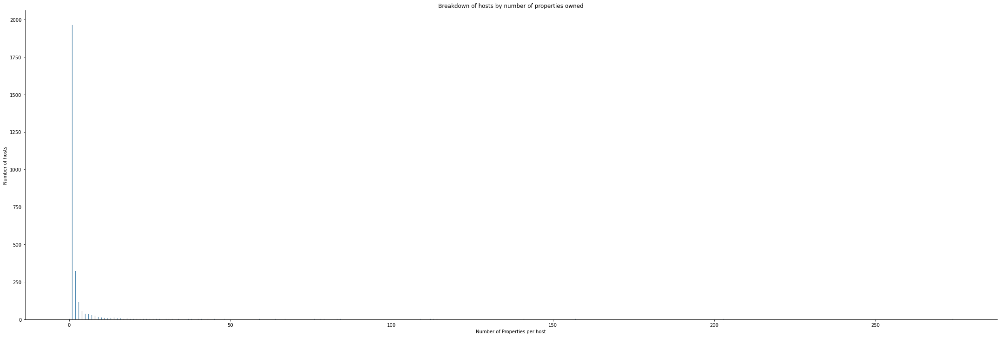

In [102]:
#plotting using sns is not very clear - I had to experiment with the height and width to get the bars to show as solid blue lines.

sns.set_style = "whitegrid"

sns.displot(x = df_num_prop_per_host['num_properties'], height = 10, aspect = 3)
plt.xlabel('Number of Properties per host')
plt.ylabel('Number of hosts')
plt.title('Breakdown of hosts by number of properties owned')
plt.show()

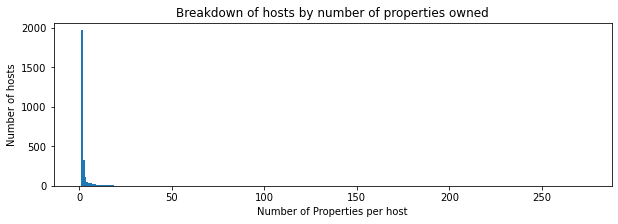

In [103]:
#I then used matplotlib to plot the chart, which shows the graph more clearly.

sns.set_style = "whitegrid"
plt.figure(figsize=(10,3))

plt.hist(x = df_num_prop_per_host['num_properties'], bins = np.arange(df_num_prop_per_host['num_properties'].min(), df_num_prop_per_host['num_properties'].max()+1))
plt.xlabel('Number of Properties per host')
plt.ylabel('Number of hosts')
plt.title('Breakdown of hosts by number of properties owned')
plt.show()

The maximum number of property hosted by any single host is 274.

In [104]:
df_num_prop_per_host['num_properties'].max()

274

And this host has the host id: 66406177

In [105]:
df_num_prop_per_host.loc[df_num_prop_per_host['num_properties'] == 274]

,host_id,num_properties
1539,66406177,274


Looking at the distribution plot, we can see that a majority of AirBNB hosts only have a small number of properties to rent. Only a small number of hosts are hosting hundreds of properties.

To get a better idea of how our data is distributed, we can apply the value_counts function. The data tells us that 1963 hosts only host 1 property on AirBNB.

In [106]:
df_num_prop_per_host['num_properties'].value_counts()

1      1963
2       322
3       113
4        54
5        35
6        32
7        27
8        23
9        15
10       12
14       11
13       10
11        8
15        7
18        5
16        5
12        5
17        4
26        3
22        3
67        3
24        3
28        2
30        2
0         2
19        2
48        2
27        2
31        2
45        2
20        1
32        1
34        1
38        1
40        1
203       1
64        1
76        1
141       1
113       1
109       1
83        1
79        1
59        1
43        1
41        1
37        1
25        1
23        1
21        1
157       1
114       1
112       1
84        1
78        1
274       1
Name: num_properties, dtype: int64

Using a lamda function, we then group our data into four buckets based on how many properties are hosted by the hsot, and add a column to include this information. The four buckets are:
- '1 to 5'
- '6 to 10'
- '11 to 20'
- 'above 20'

In [107]:
df_num_prop_per_host['num_cat'] = df_num_prop_per_host['num_properties'].apply(lambda x: '1 to 5' if x <=5 else '6 to 10' if x <= 10 else '11 to 20' if x <=20 else 'above 20')
df_num_prop_per_host['num_cat'].head()

0    1 to 5
1    1 to 5
2    1 to 5
3    1 to 5
4    1 to 5
Name: num_cat, dtype: object

We then plot the number of hosts that falls into each bucket that we have defined. Let's also add a label to each bar so that we can see the total count in each bucket.

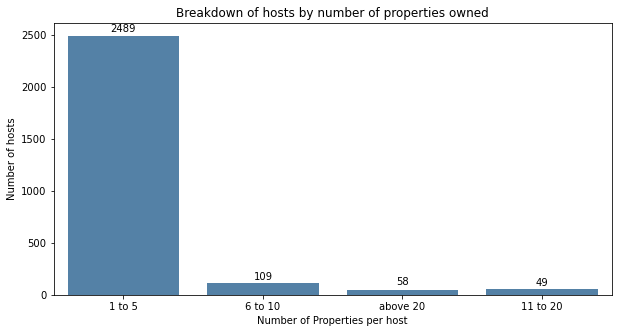

In [108]:
sns.set_style = "whitegrid"
plt.figure(figsize=(10,5))

sns.countplot(data = df_num_prop_per_host, x = 'num_cat', color = 'steelblue')

# Add value labels to each bar
for i, v in enumerate(df_num_prop_per_host['num_cat'].value_counts()):
    plt.text(i, v + 20, str(v), ha='center', va='bottom')

plt.xlabel('Number of Properties per host')
plt.ylabel('Number of hosts')
plt.title('Breakdown of hosts by number of properties owned')
plt.show()

### Data Cleaning - Removing Outliers

As part of the data cleaning process, we sometimes remove outliers in our data sets. This is because extreme data points in our data sets may skew our analyses or any machine learning model that we may be building.

First, let's take a look at the distribution of our property prices to get an idea of what we are working with.

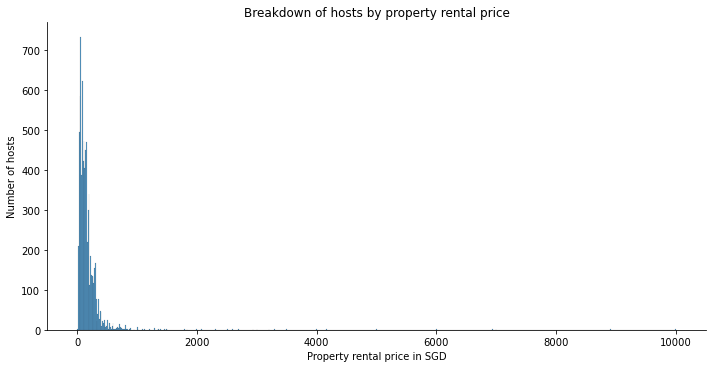

In [109]:
sns.set_style = "whitegrid"

sns.displot(df['price'], height = 5, aspect = 2)
plt.xlabel('Property rental price in SGD')
plt.ylabel('Number of hosts')
plt.title('Breakdown of hosts by property rental price')
plt.show()

Looks like there are some outliers.

We will first do a boxplot to see how the outliers are distributed.

We will then find out how many outliers there are by checking the number of properties that are priced at more than 1.5 IQR above the upper quartile.

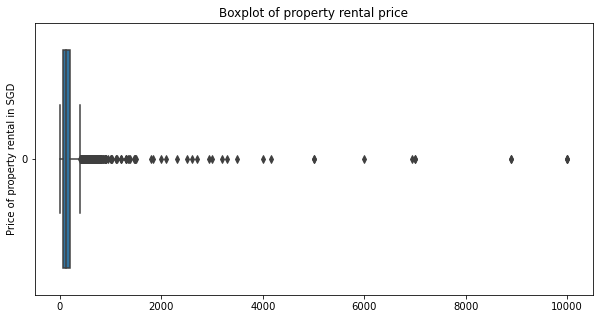

In [110]:
sns.set_style = "whitegrid"
plt.figure(figsize=(10,5))

sns.boxplot(data = df['price'], orient = 'h')
plt.ylabel('Price of property rental in SGD')
plt.title('Boxplot of property rental price')
plt.show()

In [111]:
#In this cell, we calculate the number of properties that are priced at 1.5 IQR or more than the 75th Percentile 


#First, we obtain the interquartile range, multiply it by 1.5, and store it as IQR
IQR_1_5 = (df['price'].quantile(0.75) - df['price'].quantile(0.25))*1.5

#Next, we obtain the price of rental at the 75th percentile, and store it as Upper_Q
Upper_Q = df['price'].quantile(0.75)

#We then filter our data set for properties taht are priced at 1.5 IQR or more than the 75th percentile, and apply the count function
df['id'].loc[df['price'] > (Upper_Q + IQR_1_5) ].count()

324

A total of 324 properties are counted as outliers, out of a total of 7097 listings. This is about 4.57% of our data. If we are to conduct any further analyses (e.g. creating a machine learning model to predict price), we can safely drop these outliers to prevent them from skewing our predictions.

In [112]:
#All listings rented at or above $400 has been removed as outliers.

print(Upper_Q + IQR_1_5)

400.0


In [113]:
#After removing outliers, we have a total of 7565 listings

df_nooutliers = df.loc[df['price']<400]
print(df_nooutliers['id'].count())

7565


## Data Analysis

### Quick Comparison across Regions
Let's check the spread of our rental prices by region.

Are prices likely to be higher in certain regions? We first plot a box plot of the property listings, grouped by the 5 major regions. 

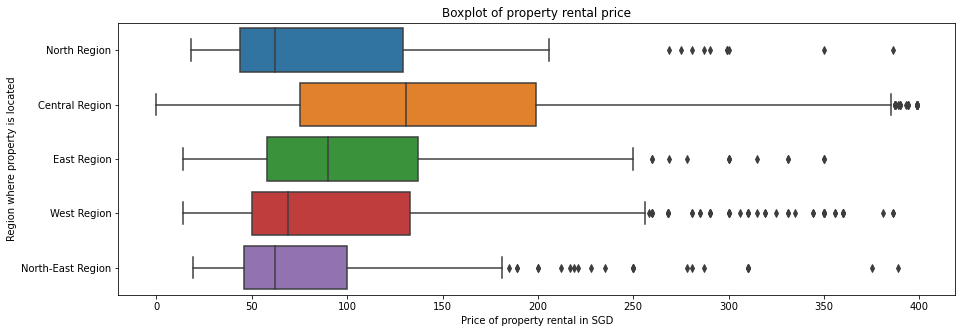

In [114]:
sns.set_style = "whitegrid"
plt.figure(figsize=(15,5))

sns.boxplot(data = df_nooutliers, x = 'price', y = 'neighbourhood_group')
plt.xlabel('Price of property rental in SGD')
plt.ylabel('Region where property is located')
plt.title('Boxplot of property rental price')
plt.show()

From the boxplot, we can see that the median rental price (50th percentile) of properties in the Central Region appears to be higher than the other regions. However, this is insufficient for us to say that the difference in prices is statistically significant, and we need to perform a more statistically rigorous test (a Z-test) to determine if the prices are indeed different between regions

Further, we want to check the distribution of our groups to ensure that the core assumptions of a Z-test are met:
- Population forms a standard normal distribution
- Sample sizes in each group are sufficiently large to conduct a Z-test (each group's n > 30)

<Figure size 720x360 with 0 Axes>

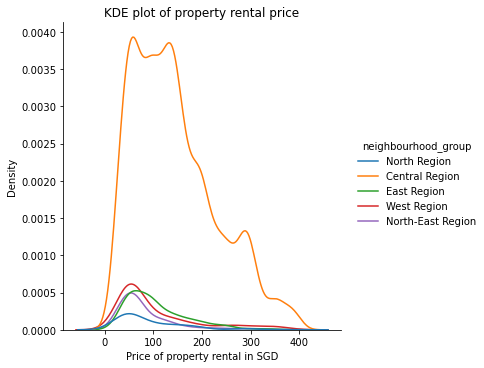

In [115]:
#We can first plot a KDE graph to check the distribution of the samples. From the graph we can make a few observations:
# - While not perfect, the distributions are approximately normal
# - The number of samples in the Central Region is much higher than the other samples.

sns.set_style = "whitegrid"
plt.figure(figsize=(10,5))

sns.displot(data = df_nooutliers, x = 'price', hue = 'neighbourhood_group', kind = 'kde')
plt.xlabel('Price of property rental in SGD')
plt.title('KDE plot of property rental price')
plt.show()

In [116]:
#We store each region into its own dataframe

df_north = df_nooutliers.loc[df_nooutliers['neighbourhood_group']=='North Region']
df_central = df_nooutliers.loc[df_nooutliers['neighbourhood_group']=='Central Region']
df_east = df_nooutliers.loc[df_nooutliers['neighbourhood_group']=='East Region']
df_west = df_nooutliers.loc[df_nooutliers['neighbourhood_group']=='West Region']
df_northeast = df_nooutliers.loc[df_nooutliers['neighbourhood_group']=='North-East Region']

How many listings are in each region?

In [117]:
dict = {'North': df_north, 'Central': df_central, 'East': df_east, 'West': df_west, 'Northeast': df_northeast}

for key, value in dict.items():
    print(key, ":", value['id'].count(), "listings")

North : 195 listings
Central : 6010 listings
East : 493 listings
West : 529 listings
Northeast : 338 listings


What is the mean and standard deviation of the rental price in each region?

In [118]:
for key, value in dict.items():
    print("The mean rental price in the", key, "Region is $", round(value['price'].mean(),2), "and the standard deviation is $", round(value['price'].std(),2))

The mean rental price in the North Region is $ 92.46 and the standard deviation is $ 70.14
The mean rental price in the Central Region is $ 144.09 and the standard deviation is $ 85.88
The mean rental price in the East Region is $ 105.91 and the standard deviation is $ 62.81
The mean rental price in the West Region is $ 104.47 and the standard deviation is $ 85.03
The mean rental price in the Northeast Region is $ 82.93 and the standard deviation is $ 60.54


### Hypothesis Testing

Given that the price of Central Region is the highest, and the low sample counts of the other regions, we can lump the samples into two groups for hypothesis testing - Central Region vs Non-Central Region. In gist, we want to find out if prices of rental properties in the Central Region are significantly different from that of Non-Central Region. We thus conduct a two-sample Z-test.

Our null hypothesis is therefore:
> The average rental price of AirBNB listings in the Central Region is the same as the average rental price of AirBNB listings in Non-Central Region

And our alternative hypothesis is:
> The average rental price of AirBNB listings in the Central Region is different from the average rental price of AirBNB listings in Non-Central Region

In [119]:
#We first create a dataframe for non central listings
df_non_central = df_nooutliers.loc[df_nooutliers['neighbourhood_group']!='Central Region']

In [120]:
#we then import ztest from statsmodel

from statsmodels.stats.weightstats import ztest as ztest

In [121]:
ztest(df_central['price'], df_non_central['price'], value=0) 

(19.150967055057308, 9.500602768236658e-82)

In [122]:
mean_central_rental = np.mean(df_central['price'])
mean_non_central_rental = np.mean(df_non_central['price'])

print('The average rental price in Central Region is $',round(mean_central_rental,2))
print('The average rental price in Non-Central Region is $', round(mean_non_central_rental,2))

The average rental price in Central Region is $ 144.09
The average rental price in Non-Central Region is $ 98.74


With a Z statistic of 19.151 and a p-value of 0, we can confidently say that prices AirBNB listings in the Central Region is statistically significantly different from the prices of AirBNB listings in Non-Central Region. In fact, at an average of \$144.09, the rental prices of AirBNB listings in Central Region is significantly higher than Non-Central Region.

We can also plot a distribution plot to show the distribution and mean prices of the two regions.

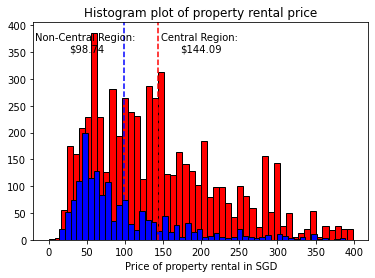

In [123]:
plt.text(200,350, 'Central Region: \n$144.09', ha = 'center')
plt.text(50,350, 'Non-Central Region: \n$98.74', ha = 'center')

plt.hist(df_central['price'],color='red',ec = 'black',bins=50)
plt.hist(df_non_central['price'],color='blue',ec = 'black',bins=50)

plt.axvline(x = mean_central_rental, ymin = 0, ymax = 1, color = 'red', linestyle = '--')
plt.axvline(x = mean_non_central_rental, ymin = 0, ymax = 1, color = 'blue', linestyle = '--')

plt.xlabel('Price of property rental in SGD')
plt.title('Histogram plot of property rental price')

plt.show()

## Geospatial Visualisation with Folium

To get a better sense of where AirBNB properties are located, we can use Folium to visually plot out the location of each AirBNB rental property.

In [124]:
singapore_map = folium.Map(location=[1.365, 103.810], zoom_start=11.48, tiles='Stamen Terrain')
singapore_map

First, we plot each of the 7907 properties onto the map to get an idea of how properties are distributed across Singapore.

(Note: Since we are not performing any statistical analysis with Geospatial visualisation, we are using the full set of data)

In [125]:
# instantiate a feature group for the locations in the dataframe
airbnb_points = folium.map.FeatureGroup()

# loop through the AirBNB locations and add each to the airbnb_points feature group
for lat, lng, in zip(df.latitude, df.longitude):
    airbnb_points.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add airbnb_points to map
singapore_map.add_child(airbnb_points)

While plotting individual points onto the map may be useful, it can seem a little bit crowded. Another option is to cluster points that are near each other for a better overview of the properties' distribution.

Using this option, Folium automatically clusters properties that are near each other as you zoom in or out, showing you the aggregate number of properties in the region.

In [126]:
from folium import plugins

# let's start again with a clean copy of the map
singapore_map = folium.Map(location=[1.365, 103.810], zoom_start=11.48, tiles='Stamen Terrain')

# instantiate a mark cluster object for the locations in the dataframe
airbnb_points = plugins.MarkerCluster().add_to(singapore_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label1, label2, in zip(df.latitude, df.longitude, df.host_name, df.price):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup= [label1, '$'+str(label2)],
    ).add_to(airbnb_points)

# display map
singapore_map

While the above option is a very elegant way of displaying clusters of listings, Folium automatically clusters the listings based on what it thinks is near each other, and does not respect actual political or administrative boundaries that may be in place.

In order to show the number of properties in each administrative boundary, we can use a GeoJSON file to create an overlay and display the count of properties in each region.

In [127]:
#Apply the value_counts function on 'neighbourhood' column. This tells us the count of number of properties in each neighbourhood.
planning_count = pd.DataFrame(df['neighbourhood'].value_counts()).reset_index()

#Rename the column headers and standardize the capitalisation of the 'Neighbourhood'
planning_count.columns = ['Neighbourhood','Count']
planning_count['Neighbourhood'] = planning_count['Neighbourhood'].str.upper()

#Add data points to represent the latitude and longitude of each neighbourhood area
planning_count['Lat'] = [1.31250,1.32297,1.32679,1.30364,1.28356,1.27864,1.28582,1.32408,1.29832,1.29997,1.30674,1.28929,1.30315,1.34283,1.30511,1.30891,1.32977,1.32743,1.37059,1.31435,1.33731,1.37546,1.36383,1.39496,1.44361,1.35642,1.34544,1.38515,1.29639,1.38104,1.35488,1.41501,1.40300,1.45568,1.36240,1.38235,1.24964,1.42364,1.36098,1.41911,1.43311,1.27775,1.28083]
planning_count['Long'] = [103.86410,103.89099,103.83694,103.85289,103.84303,103.82360,103.85569,103.93189,103.83376,103.78995,103.81591,103.84512,103.90047,103.70447,103.83182,103.83901,103.79251,103.73752,103.88894,103.76247,103.85979,103.94850,103.86600,103.88398,103.78818,103.75327,103.95150,103.74804,103.84619,103.84416,103.84129,103.84342,103.90621,103.81988,103.81252,103.76821,103.82930,103.75705,103.67090,103.79315,103.71292,103.86722,103.62877]

#Display the table
planning_count

,Neighbourhood,Count,Lat,Long
0,KALLANG,1043,1.31250,103.86410
1,GEYLANG,994,1.32297,103.89099
2,NOVENA,537,1.32679,103.83694
3,ROCHOR,536,1.30364,103.85289
4,OUTRAM,477,1.28356,103.84303
5,BUKIT MERAH,470,1.27864,103.82360
6,DOWNTOWN CORE,428,1.28582,103.85569
7,BEDOK,373,1.32408,103.93189
8,RIVER VALLEY,362,1.29832,103.83376
9,QUEENSTOWN,266,1.29997,103.78995


In [128]:
singapore_map = folium.Map(location=[1.365, 103.810], zoom_start=11.48, tiles='Stamen Terrain')

import json
   
# Opening JSON file
singapore_planning_zone = open(r"\Users\kanwi\OneDrive\Desktop\Data Projects\Airbnb listings in Singapore\singapore-planning-area.geojson")
   
# returns JSON object as a dictionary
geodata = json.load(singapore_planning_zone)

In [129]:
singapore_map.choropleth(
    geo_data=geodata,
    data=planning_count,
    columns=['Neighbourhood', 'Count'],
    key_on='feature.properties.name',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Singapore'
)

# instantiate a feature group for the locations in the dataframe
neighbourhood_points = folium.map.FeatureGroup()

# loop through the 4 regions and add each to the regional_points feature group
for lat, lng, label1, label2 in zip(planning_count.Lat, planning_count.Long, planning_count.Neighbourhood, planning_count.Count):
    neighbourhood_points.add_child(
        folium.Marker(
            location = [lat, lng],
            icon = None,
            popup = [label1, str(label2)]
        )
    )
    
# add regional_points to map
singapore_map.add_child(neighbourhood_points)

# display map
singapore_map

C:\Users\kanwi\anaconda3\lib\site-packages\folium\folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## Conclusion

This project is an exercise for me to practice data analysis, data cleaning, data visualisation and geospatial visualisation techniques that I have acquired in the past few months. I hope you have had as much fun reading as I have had practicing!

<b>Author</b> - Royston Kan

<b>Date</b> - 25 September 2023